In [162]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['font.size'] = 16

# Import data

In [138]:
df = pd.read_csv('train.csv')
df.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.0
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.0
2,4,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.0
3,4,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.0
4,4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.0


In [57]:
df.isnull().values.any()

False

In [58]:
elements = pd.read_csv('unique_m.csv')
elements.describe()

,H,He,Li,Be,B,C,N,O,F,Ne,...,Pt,Au,Hg,Tl,Pb,Bi,Po,At,Rn,critical_temp
count,21263.000000,21263.0,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.0,...,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.000000,21263.0,21263.0,21263.0,21263.000000
mean,0.017685,0.0,0.012125,0.034638,0.142594,0.384968,0.013284,3.009129,0.014874,0.0,...,0.034108,0.020535,0.036663,0.047954,0.042461,0.201009,0.0,0.0,0.0,34.421219
std,0.267220,0.0,0.129552,0.848541,1.044486,4.408032,0.150427,3.811649,0.132119,0.0,...,0.307888,0.717975,0.205846,0.272298,0.274365,0.655927,0.0,0.0,0.0,34.254362
min,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000210
25%,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,5.365000
50%,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,20.000000
75%,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,6.800000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,63.000000
max,14.000000,0.0,3.000000,40.000000,105.000000,120.000000,12.800000,66.000000,4.000000,0.0,...,5.800000,64.000000,8.000000,7.000000,19.000000,14.000000,0.0,0.0,0.0,185.000000


In [59]:
elements.isnull().values.any()

False

There is no missing data in any of the datasets, great. Now preoceed to feature selection. The first step is to get rid of elements that don't appear in any of the samples.

In [108]:
reduced_ele = elements.loc[:, (elements != 0).any(axis=0)] # select columns containing non-zero elements
reduced_ele = reduced_ele.drop('material', axis = 1)
reduced_ele.head()

,H,Li,Be,B,C,N,O,F,Na,Mg,...,Re,Os,Ir,Pt,Au,Hg,Tl,Pb,Bi,critical_temp
0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,29.0
1,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,26.0
2,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.0
3,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.0
4,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,23.0


In [109]:
ele_feature = reduced_ele.drop('critical_temp', axis = 1)

# Visualization

In [40]:
print(df.columns)

Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass', 'mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie',
       'mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius',
       'mean_Density', 'wtd_mean_Density', 'gmean_Density',
       'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density',
       'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density',
       'mean_ElectronAffinity', 'wtd_mean_ElectronAffinity',
       'gmean_

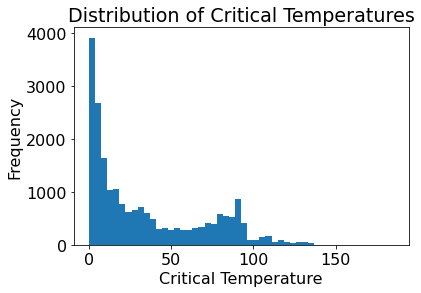

In [166]:
ax = df['critical_temp'].plot.hist(bins = 50)
ax.set_title('Distribution of Critical Temperatures')
ax.set_xlabel('Critical Temperature')
plt.savefig('ct_hist.pdf', bbox_inches = 'tight')

(array([1.0337e+04, 3.3630e+03, 1.6860e+03, 1.6280e+03, 2.9360e+03,
        9.1500e+02, 2.9900e+02, 9.8000e+01, 0.0000e+00, 1.0000e+00]),
 array([2.10000000e-04, 1.85001890e+01, 3.70001680e+01, 5.55001470e+01,
        7.40001260e+01, 9.25001050e+01, 1.11000084e+02, 1.29500063e+02,
        1.48000042e+02, 1.66500021e+02, 1.85000000e+02]),
 <BarContainer object of 10 artists>)

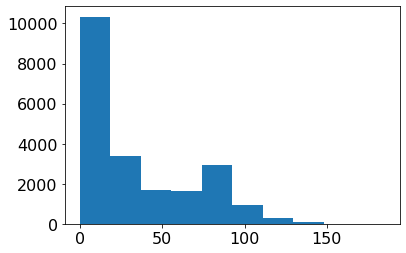

In [167]:
log_temp = np.asarray(df['critical_temp'])
plt.hist(log_temp)

From the histogram, we can see that the frequency of critical temperatures is very skewed towards 0.

### pairplot of atomic mass

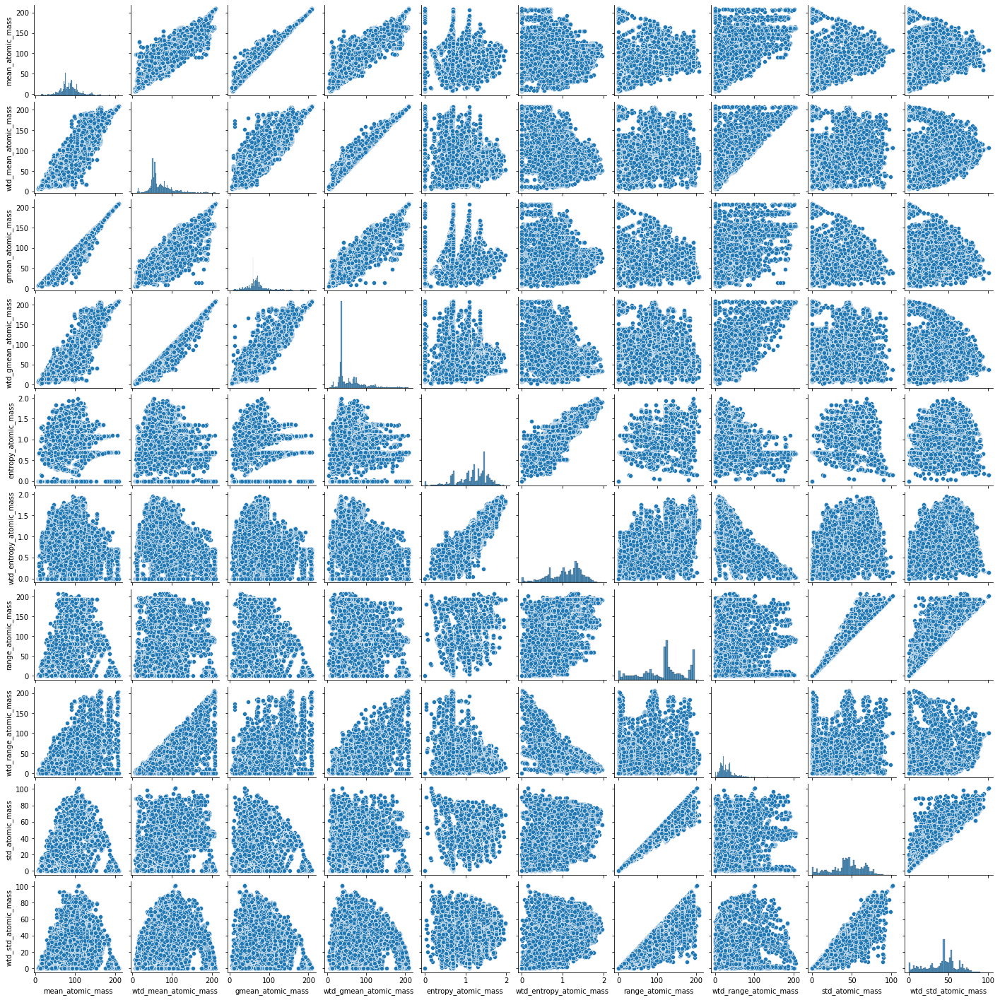

In [41]:
atomic_mass_cols = ['mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass']
sns.pairplot(df, 
             x_vars= atomic_mass_cols,
             y_vars= atomic_mass_cols,
             height=2,
             aspect=1.0)
plt.show()

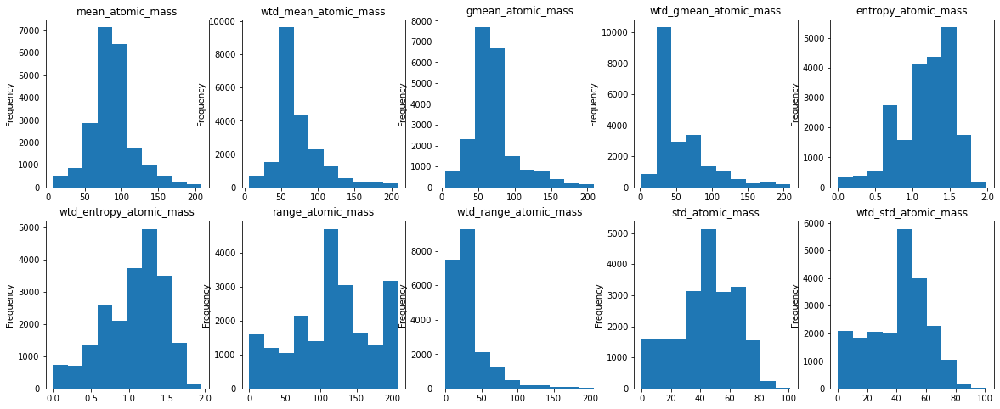

In [11]:
atomic_mass_cols = ['mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass']
fig, axes = plt.subplots(2,5, figsize = (20,8))
axes = axes.flatten()
for i in range(len(atomic_mass_cols)):
    ax = axes[i]
    ax.set_title(atomic_mass_cols[i])
    df[atomic_mass_cols[i]].plot.hist(ax = ax)

### pairplot of fie

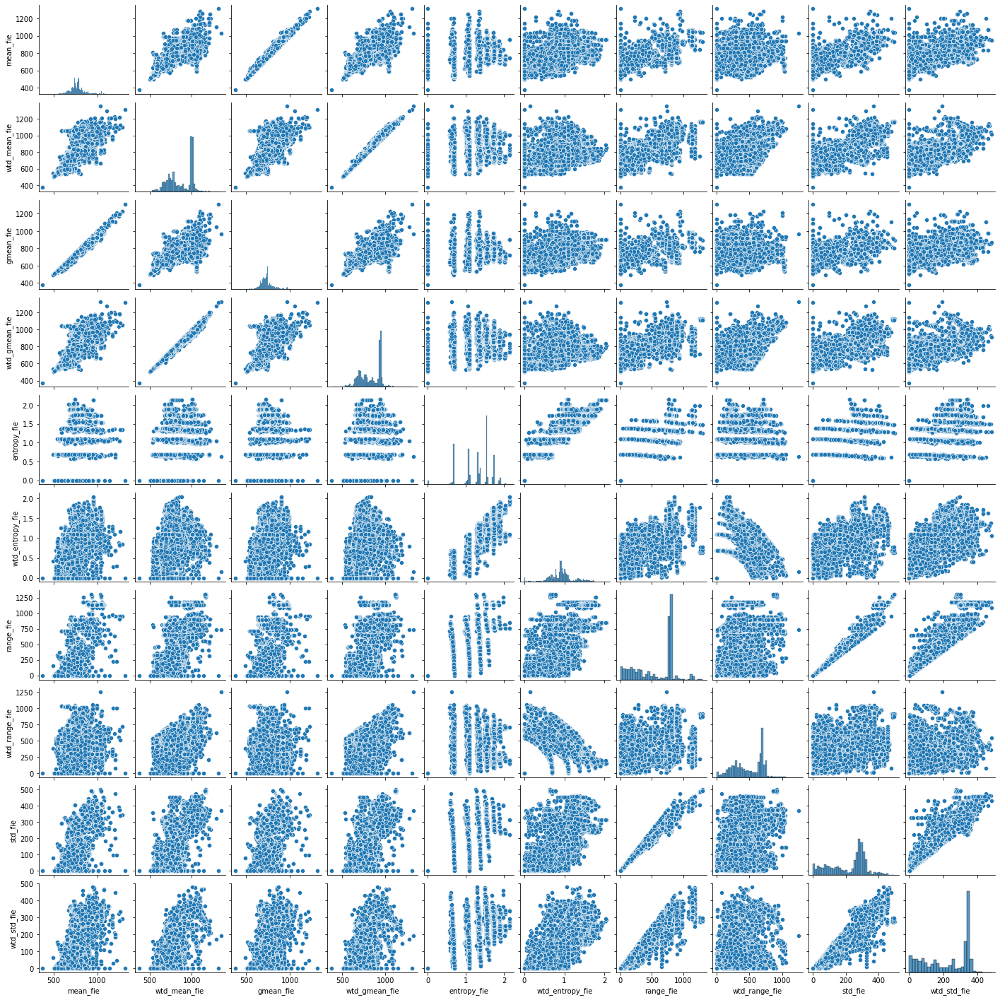

In [42]:
sns.pairplot(df, 
             x_vars= ['mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie'],
             y_vars= ['mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie'],
             height=2,
             aspect=1.0)
plt.show()

### pairplot of atomic radius

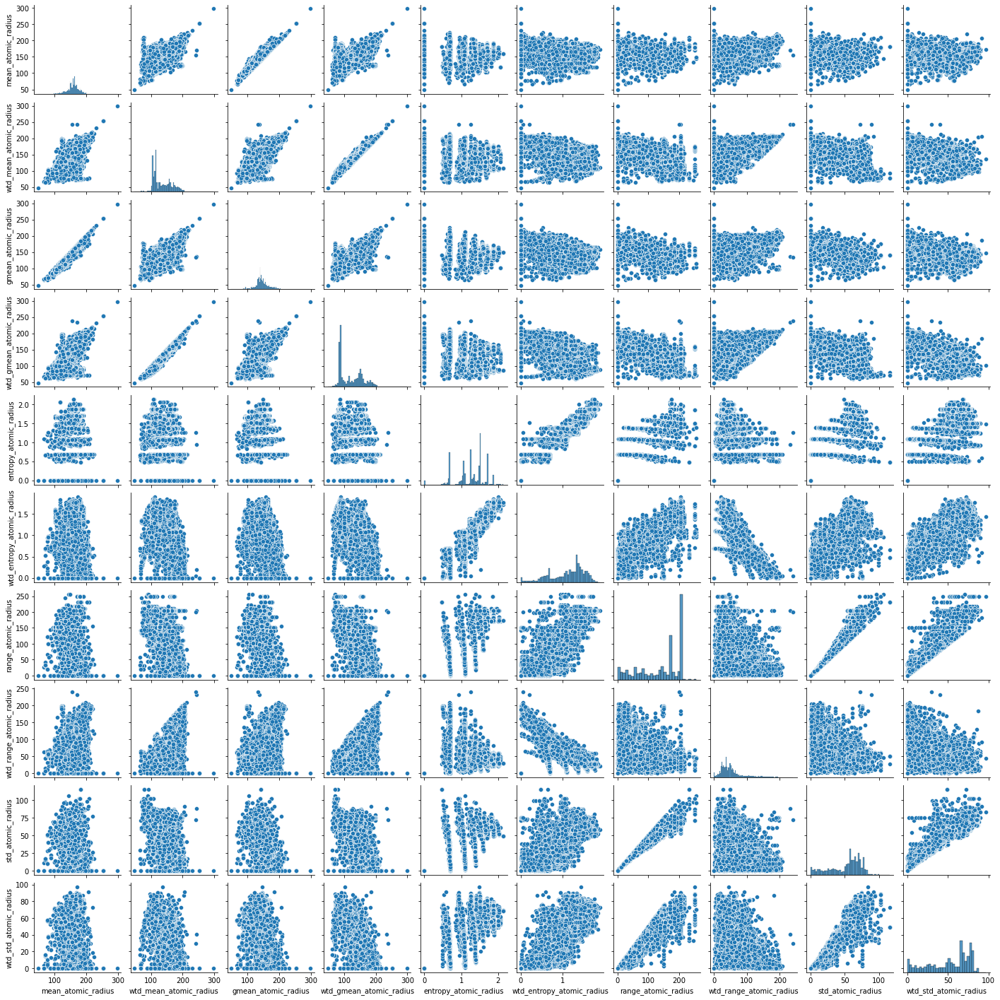

In [13]:
sns.pairplot(df, 
             x_vars= ['mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius'],
             y_vars= ['mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius'],
             height=2,
             aspect=1.0)
plt.show()

### pairplot of density

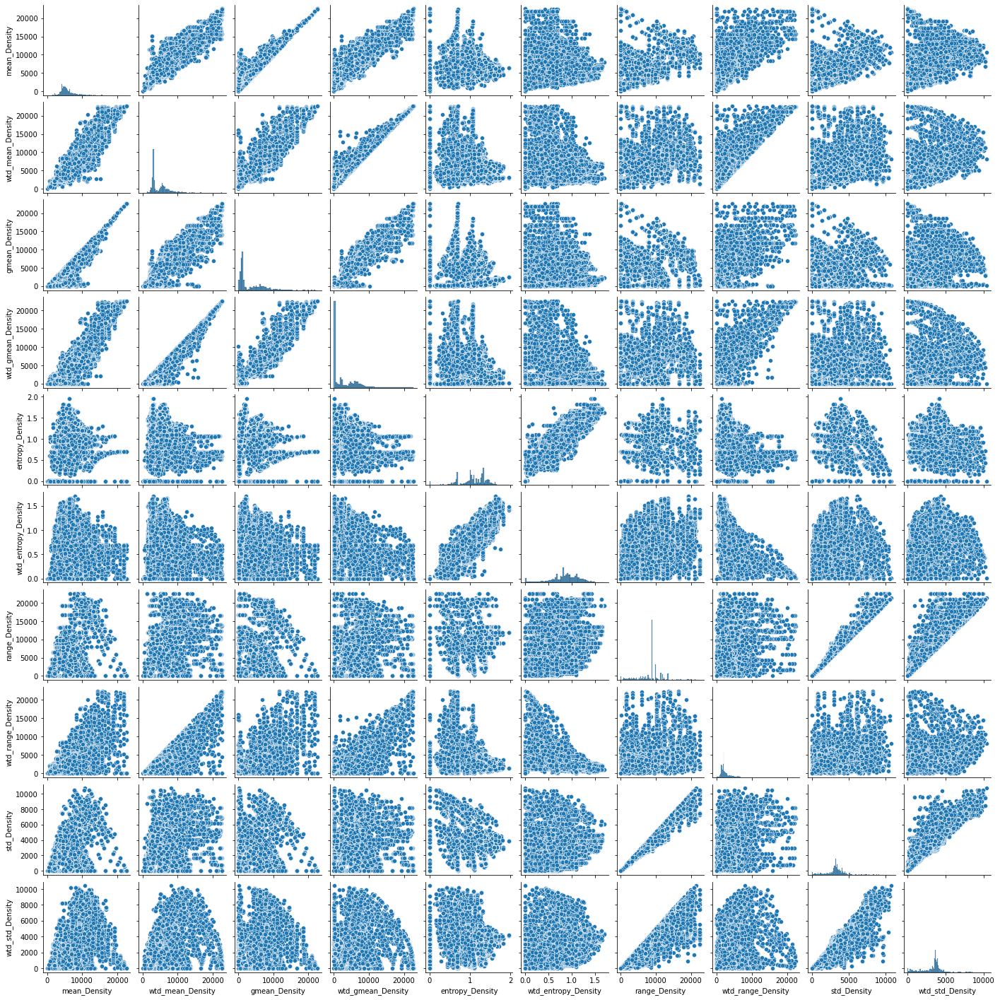

In [14]:
sns.pairplot(df, 
             x_vars= ['mean_Density', 'wtd_mean_Density', 'gmean_Density',
       'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density',
       'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density'],
             y_vars= ['mean_Density', 'wtd_mean_Density', 'gmean_Density',
       'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density',
       'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density'],
             height=2,
             aspect=1.0)
plt.show()

### pairplot of electron affinity

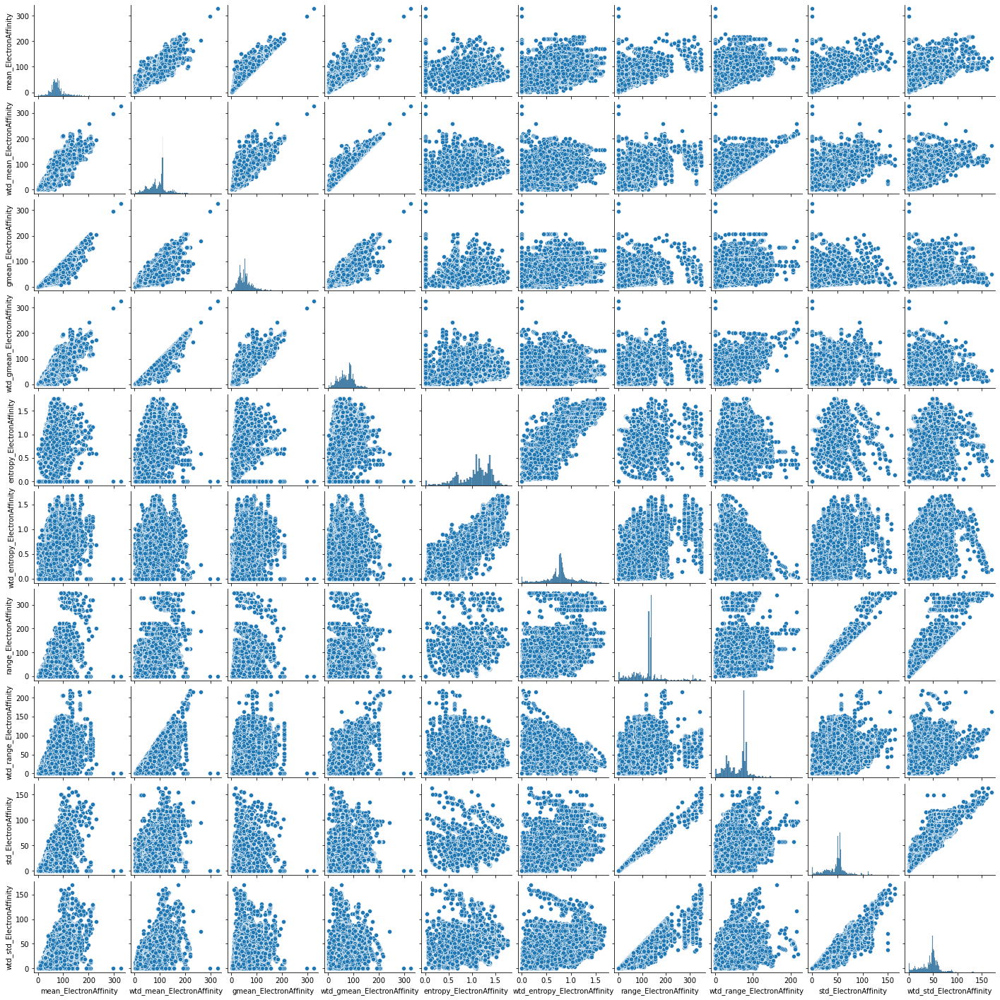

In [15]:
sns.pairplot(df, 
             x_vars= ['mean_ElectronAffinity', 'wtd_mean_ElectronAffinity',
       'gmean_ElectronAffinity', 'wtd_gmean_ElectronAffinity',
       'entropy_ElectronAffinity', 'wtd_entropy_ElectronAffinity',
       'range_ElectronAffinity', 'wtd_range_ElectronAffinity',
       'std_ElectronAffinity', 'wtd_std_ElectronAffinity'],
             y_vars= ['mean_ElectronAffinity', 'wtd_mean_ElectronAffinity',
       'gmean_ElectronAffinity', 'wtd_gmean_ElectronAffinity',
       'entropy_ElectronAffinity', 'wtd_entropy_ElectronAffinity',
       'range_ElectronAffinity', 'wtd_range_ElectronAffinity',
       'std_ElectronAffinity', 'wtd_std_ElectronAffinity'],
             height=2,
             aspect=1.0)
plt.show()

### pairplot of fusion heat

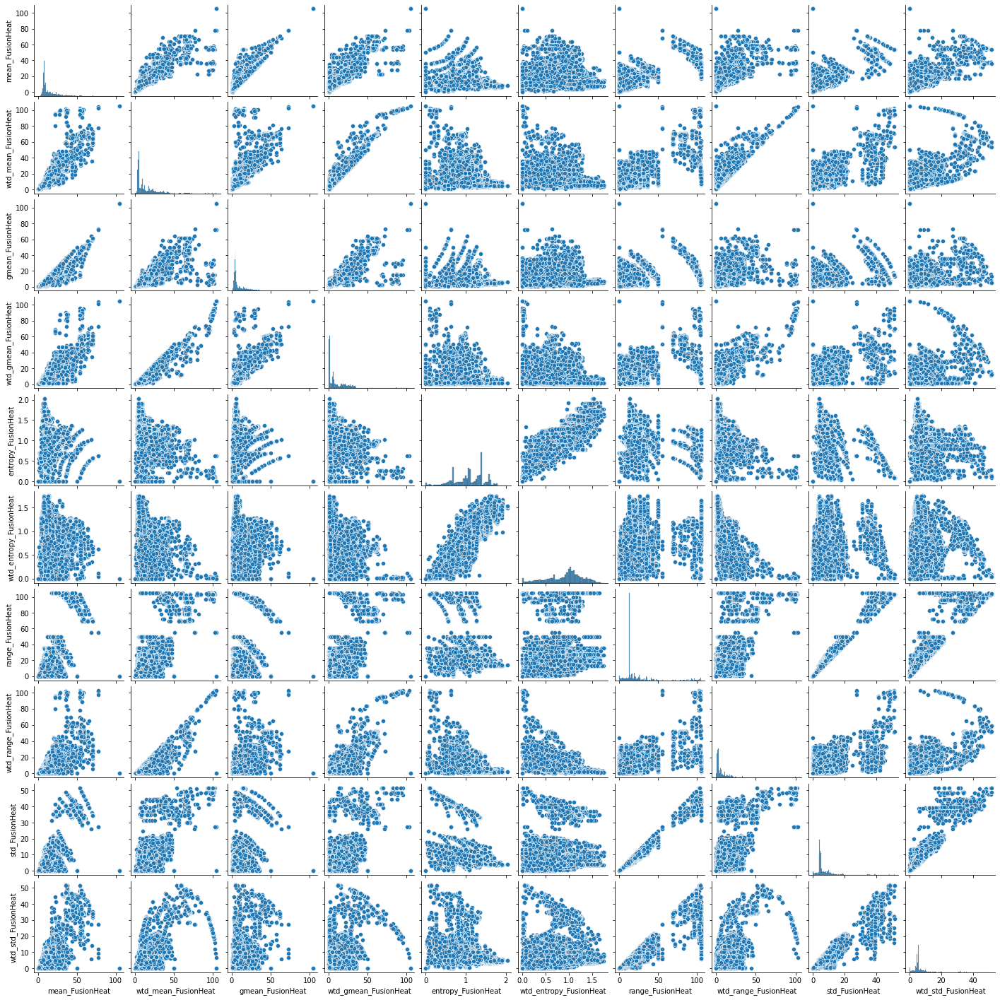

In [16]:
sns.pairplot(df, 
             x_vars= ['mean_FusionHeat',
       'wtd_mean_FusionHeat', 'gmean_FusionHeat', 'wtd_gmean_FusionHeat',
       'entropy_FusionHeat', 'wtd_entropy_FusionHeat', 'range_FusionHeat',
       'wtd_range_FusionHeat', 'std_FusionHeat', 'wtd_std_FusionHeat'],
             y_vars= ['mean_FusionHeat',
       'wtd_mean_FusionHeat', 'gmean_FusionHeat', 'wtd_gmean_FusionHeat',
       'entropy_FusionHeat', 'wtd_entropy_FusionHeat', 'range_FusionHeat',
       'wtd_range_FusionHeat', 'std_FusionHeat', 'wtd_std_FusionHeat'],
             height=2,
             aspect=1.0)
plt.show()

### pairplot of thermal conductivity

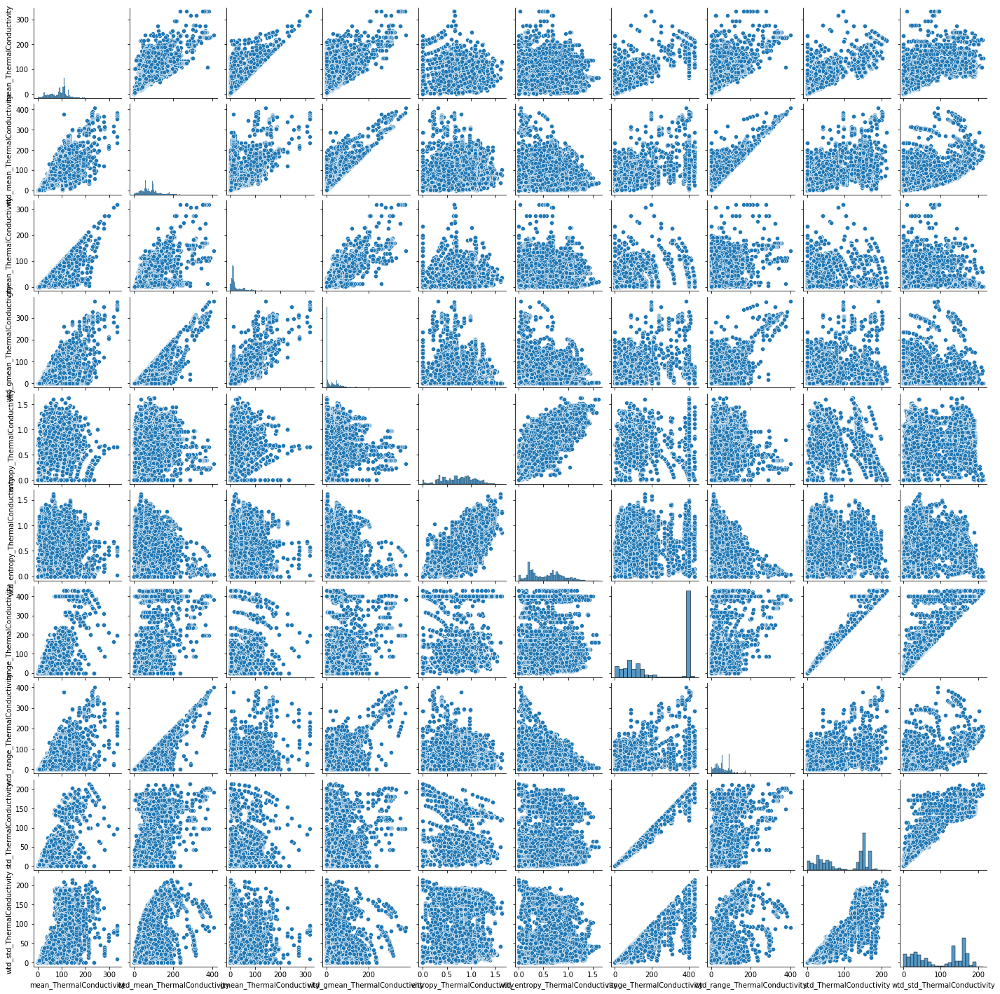

In [17]:
sns.pairplot(df, 
             x_vars= ['mean_ThermalConductivity', 'wtd_mean_ThermalConductivity',
       'gmean_ThermalConductivity', 'wtd_gmean_ThermalConductivity',
       'entropy_ThermalConductivity', 'wtd_entropy_ThermalConductivity',
       'range_ThermalConductivity', 'wtd_range_ThermalConductivity',
       'std_ThermalConductivity', 'wtd_std_ThermalConductivity'],
             y_vars= ['mean_ThermalConductivity', 'wtd_mean_ThermalConductivity',
       'gmean_ThermalConductivity', 'wtd_gmean_ThermalConductivity',
       'entropy_ThermalConductivity', 'wtd_entropy_ThermalConductivity',
       'range_ThermalConductivity', 'wtd_range_ThermalConductivity',
       'std_ThermalConductivity', 'wtd_std_ThermalConductivity'],
             height=2,
             aspect=1.0)
plt.show()

### pairplot of valence

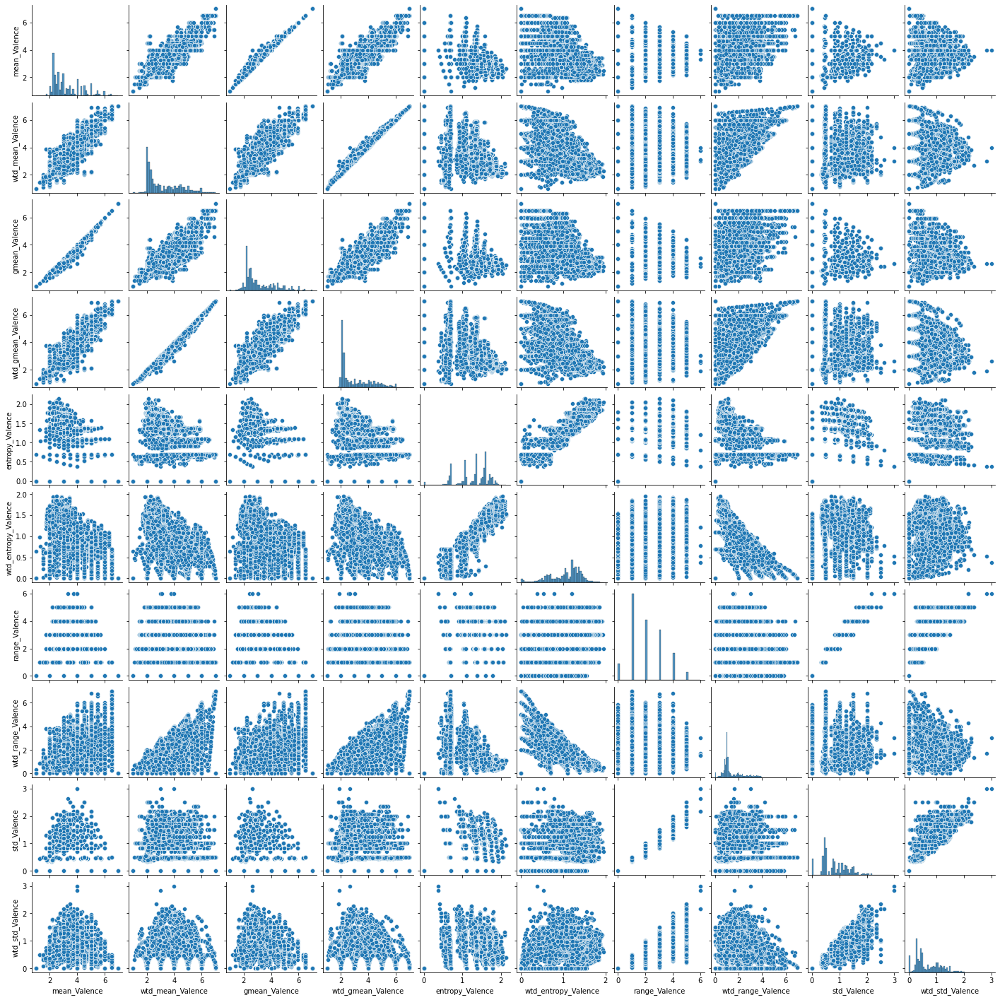

In [18]:
sns.pairplot(df, 
             x_vars= ['mean_Valence', 'wtd_mean_Valence', 'gmean_Valence',
       'wtd_gmean_Valence', 'entropy_Valence', 'wtd_entropy_Valence',
       'range_Valence', 'wtd_range_Valence', 'std_Valence', 'wtd_std_Valence'],
             y_vars= ['mean_Valence', 'wtd_mean_Valence', 'gmean_Valence',
       'wtd_gmean_Valence', 'entropy_Valence', 'wtd_entropy_Valence',
       'range_Valence', 'wtd_range_Valence', 'std_Valence', 'wtd_std_Valence'],
             height=2,
             aspect=1.0)
plt.show()

## Correlation heatmap

In [43]:
df_feature = df.drop('critical_temp', axis = 1)

<AxesSubplot:>

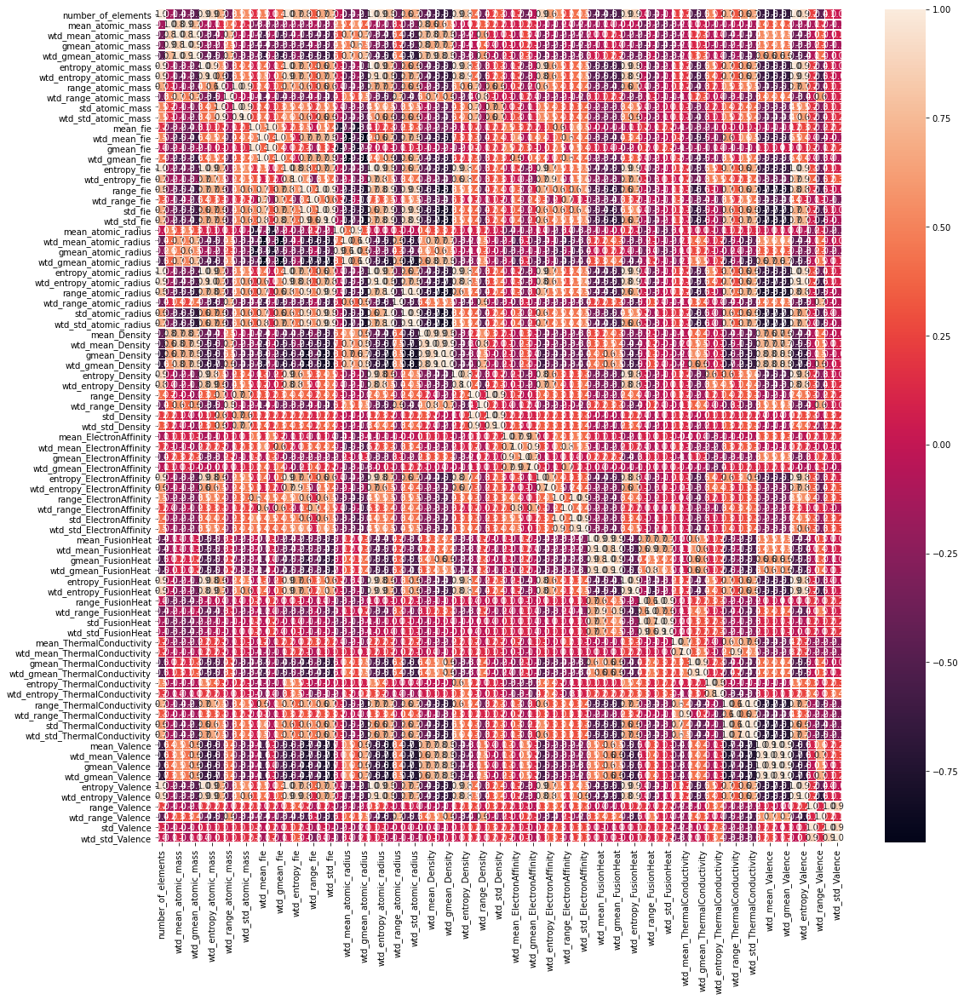

In [20]:
f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(df_feature.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

In [61]:
mass_col = ['mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass']
fie_col = ['mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie']
radius_col = ['mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius']
density_col = ['mean_Density', 'wtd_mean_Density', 'gmean_Density',
       'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density',
       'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density']
affinity_col = ['mean_ElectronAffinity', 'wtd_mean_ElectronAffinity',
       'gmean_ElectronAffinity', 'wtd_gmean_ElectronAffinity',
       'entropy_ElectronAffinity', 'wtd_entropy_ElectronAffinity',
       'range_ElectronAffinity', 'wtd_range_ElectronAffinity',
       'std_ElectronAffinity', 'wtd_std_ElectronAffinity']
fusion_col = ['mean_FusionHeat',
       'wtd_mean_FusionHeat', 'gmean_FusionHeat', 'wtd_gmean_FusionHeat',
       'entropy_FusionHeat', 'wtd_entropy_FusionHeat', 'range_FusionHeat',
       'wtd_range_FusionHeat', 'std_FusionHeat', 'wtd_std_FusionHeat']
th_con_col = ['mean_ThermalConductivity', 'wtd_mean_ThermalConductivity',
       'gmean_ThermalConductivity', 'wtd_gmean_ThermalConductivity',
       'entropy_ThermalConductivity', 'wtd_entropy_ThermalConductivity',
       'range_ThermalConductivity', 'wtd_range_ThermalConductivity',
       'std_ThermalConductivity', 'wtd_std_ThermalConductivity']
valence_col = ['mean_Valence', 'wtd_mean_Valence', 'gmean_Valence',
       'wtd_gmean_Valence', 'entropy_Valence', 'wtd_entropy_Valence',
       'range_Valence', 'wtd_range_Valence', 'std_Valence', 'wtd_std_Valence']
feat_group = [mass_col, fie_col, radius_col, density_col, affinity_col, fusion_col, th_con_col, valence_col]

(8,)


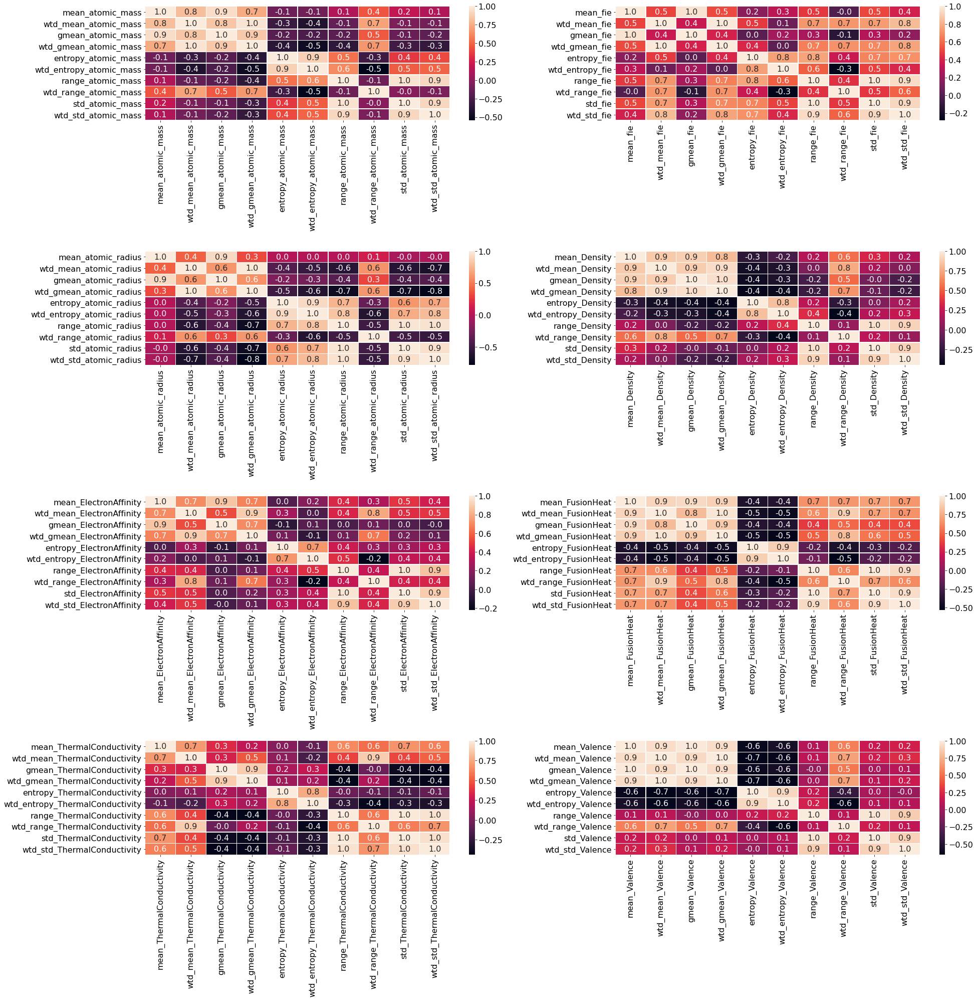

In [169]:
f,axes = plt.subplots(4,2, figsize=(28, 28))
axes = axes.flatten()
print(axes.shape)
for i in range(8):
    ax = axes[i]
    sns.heatmap(df_feature[feat_group[i]].corr(), annot=True, linewidths=.5, fmt= '.1f',ax = ax)
plt.tight_layout()
plt.savefig("/Users/chenyuzhang/Documents/EEPS1960D/heatmap.png", bbox_inches = 'tight')

# Baseline approach: Linear regression with regularization

## Train-test split

Use 80% for training, 10% for validation, and 10% for test

In [62]:
variables = df_feature.columns
critical_temp = df['critical_temp']

In [139]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df_feature, critical_temp, test_size=0.2, random_state=42)

n_train = X_train.shape[0]
n_test = X_test.shape[0]
n_feats = X_train.shape[1]

print('number of observations in training set:', n_train)
print('number of observations in test set:', n_test)
print('number of features:', n_feats)

number of observations in training set: 17010
number of observations in test set: 4253
number of features: 81


In [111]:
Xe_train, Xe_test, ye_train, ye_test = train_test_split(ele_feature, critical_temp, test_size=0.15, random_state=42)

n_train = Xe_train.shape[0]
n_test = Xe_test.shape[0]
n_feats = Xe_train.shape[1]

print('number of observations in training set:', n_train)
print('number of observations in test set:', n_test)
print('number of features:', n_feats)

number of observations in training set: 18073
number of observations in test set: 3190
number of features: 77


## Standarize the data

In [64]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [112]:
scaler_e = StandardScaler()
scaler_e.fit(Xe_train)
Xe_train = scaler_e.transform(Xe_train)
Xe_test = scaler_e.transform(Xe_test)

In [65]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, r2_score

In [142]:
lr = LinearRegression()
lr.fit(X_train, y_train)
print('training mean squared error:', np.round(mean_squared_error(y_train, lr.predict(X_train)),4))

scores_lr = cross_val_score(lr, X_train, y_train, cv=10, scoring= 'neg_mean_squared_error')

print("validation mean squared errors:",np.round(-scores_lr,4))
print("average:", np.round(np.mean(-scores_lr),4))

training mean squared error: 310.218
validation mean squared errors: [340.4328 324.2801 287.3622 329.0886 294.3007 320.4525 319.3144 307.9191
 299.0817 306.4879]
average: 312.872


In [67]:
print('LR coefficients:')
for i, coeff in enumerate(lr.coef_):
  print('{0:5s}  {1:>-10.2f}'.format(df_feature.columns[i], np.round(coeff,2)))

LR coefficients:
number_of_elements       -5.36
mean_atomic_mass       25.47
wtd_mean_atomic_mass      -31.78
gmean_atomic_mass      -15.94
wtd_gmean_atomic_mass       25.31
entropy_atomic_mass      -13.69
wtd_entropy_atomic_mass        2.04
range_atomic_mass       11.75
wtd_range_atomic_mass        0.87
std_atomic_mass      -11.35
wtd_std_atomic_mass        1.92
mean_fie       10.74
wtd_mean_fie      -16.65
gmean_fie       -8.90
wtd_gmean_fie       16.15
entropy_fie      -44.06
wtd_entropy_fie       14.99
range_fie       20.87
wtd_range_fie        5.00
std_fie      -20.76
wtd_std_fie       -4.56
mean_atomic_radius       -6.36
wtd_mean_atomic_radius       87.11
gmean_atomic_radius       -0.42
wtd_gmean_atomic_radius      -94.25
entropy_atomic_radius       30.66
wtd_entropy_atomic_radius       17.60
range_atomic_radius       14.69
wtd_range_atomic_radius       -3.43
std_atomic_radius      -11.20
wtd_std_atomic_radius       -6.38
mean_Density      -14.56
wtd_mean_Density        0.86
gmea

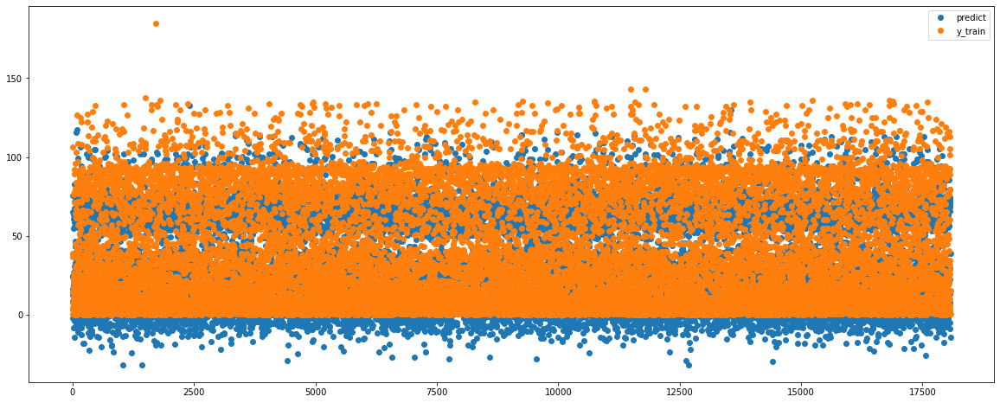

In [51]:
idx = np.arange(len(y_train))
lr_pred = lr.predict(X_train)
fig = plt.figure(figsize = (20,8))
plt.plot(idx, lr_pred, 'o', label = 'predict')
plt.plot(idx, y_train, 'o', label = 'y_train')
plt.legend()

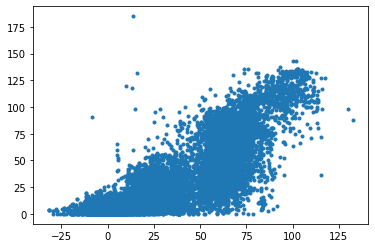

In [99]:
plt.plot(lr_pred, y_train,'.')
plt.show()

<AxesSubplot:xlabel='critical_temp'>

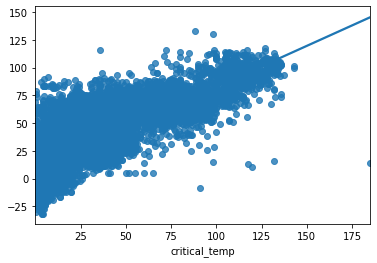

In [97]:
sns.regplot(x = y_train, y = lr_pred)

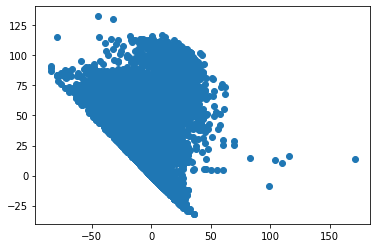

In [92]:
plt.scatter(residual,lr_pred)

(array([6.0000e+01, 7.2900e+02, 4.3460e+03, 1.0257e+04, 2.6230e+03,
        5.0000e+01, 3.0000e+00, 4.0000e+00, 0.0000e+00, 1.0000e+00]),
 array([-84.51407371, -58.92750319, -33.34093267,  -7.75436215,
         17.83220837,  43.41877889,  69.00534941,  94.59191993,
        120.17849044, 145.76506096, 171.35163148]),
 <BarContainer object of 10 artists>)

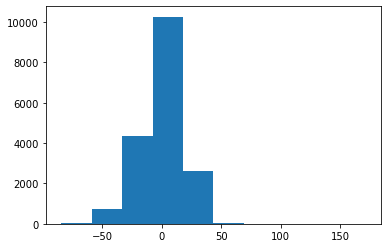

In [93]:
plt.hist(residual)

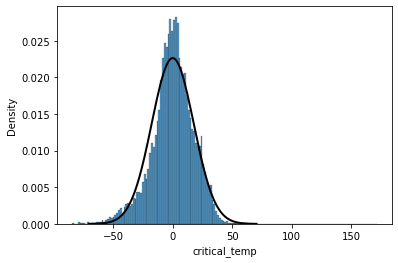

In [100]:
from scipy import stats
def normal(mean, std, color="black"):
    x = np.linspace(mean-4*std, mean+4*std, 200)
    p = stats.norm.pdf(x, mean, std)
    z = plt.plot(x, p, color, linewidth=2)

data = residual  
ax = sns.histplot(x=data, stat="density")
normal(data.mean(), data.std())

In [70]:
import dalex as dx
lr_exp = dx.Explainer(lr, X_train, y_train, label = "Linear Regression")

Preparation of a new explainer is initiated

  -> data              : numpy.ndarray converted to pandas.DataFrame. Columns are set as string numbers.
  -> data              : 18073 rows 81 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 18073 values
  -> model_class       : sklearn.linear_model._base.LinearRegression (default)
  -> label             : Linear Regression
  -> predict function  : <function yhat_default at 0x7fe668319700> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = -31.9, mean = 34.5, max = 1.33e+02
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -84.5, mean = -9.06e-16, max = 1.71e+02
  -> model_info        : package sklearn

A new explainer has been created!


In [71]:
lr_exp.model_performance()

,mse,rmse,r2,mae,mad
Linear Regression,310.243242,17.613723,0.736406,13.319865,10.153717


In [82]:
lr_dia = lr_exp.model_diagnostics()
lr_dia.result

,0,1,2,3,4,5,6,7,8,9,...,77,78,79,80,y,y_hat,residuals,abs_residuals,label,ids
0,-0.775590,-0.040450,-0.213859,-0.200837,-0.237974,-0.901324,-0.126241,0.569277,-0.456127,0.960263,...,-0.840590,-0.083657,-0.761845,-0.386079,4.50,12.749283,-8.249283,8.249283,Linear Regression,1
1,0.613699,-0.491554,-0.495221,-0.388352,-0.625303,0.767604,-0.057048,0.131110,0.080692,-0.208921,...,-0.840590,-0.358712,-0.909000,-0.524117,7.60,23.875261,-16.275261,16.275261,Linear Regression,2
2,1.308344,-0.175008,0.783873,-0.586170,0.351406,0.718166,0.647227,1.411787,0.259711,1.320055,...,2.377880,0.100689,2.286949,2.446660,3.01,-2.252168,5.262168,5.262168,Linear Regression,3
3,-0.080945,-1.015739,-0.373314,-0.489205,0.013507,0.540160,0.158594,-1.478305,-0.230302,-1.598325,...,0.768645,0.326000,0.570768,1.137659,14.10,16.180823,-2.080823,2.080823,Linear Regression,4
4,-0.080945,-0.371062,-0.483394,-0.384347,-0.621636,0.086740,-0.205695,0.131110,0.060235,-0.007643,...,-0.840590,-0.390899,-0.840965,-0.515578,36.80,24.387458,12.412542,12.412542,Linear Regression,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18068,-1.470234,-2.090621,-1.427585,-1.474327,-0.908387,-1.298126,-0.961416,-2.066185,-1.075325,-2.147914,...,-0.840590,-1.466247,-0.702914,-0.412945,1.50,22.146671,-20.646671,20.646671,Linear Regression,18069
18069,-0.080945,1.911258,1.653664,2.070689,1.704632,0.438570,0.632219,-0.247720,-0.026711,0.258515,...,-0.840590,0.701518,-0.840965,-0.665312,5.82,-5.016012,10.836012,10.836012,Linear Regression,18070
18070,0.613699,0.270854,-0.478341,0.068346,-0.592021,0.695608,1.046040,0.755202,-0.696640,0.529925,...,-0.840590,-0.497329,-0.909000,-0.893021,60.00,70.124185,-10.124185,10.124185,Linear Regression,18071
18071,-0.080945,0.169321,-0.358777,-0.102316,-0.590750,0.017597,-0.172068,0.340451,0.130993,0.549268,...,-0.035972,-0.434791,-0.024569,-0.373728,15.00,38.612105,-23.612105,23.612105,Linear Regression,18072


We are getting plenty of negative predicted temperature, but the critical temperature only makes sense to be above 0, since it's measured in K. Definitely need some regularization.

## Ridge regression

In [126]:
from sklearn.linear_model import Ridge

n_fold = 10
alphas = np.logspace(-5, 7, 51)
coeffs = np.zeros((len(alphas), n_feats))
cv_scores = np.zeros((len(alphas), n_fold))

for i, alpha in enumerate(alphas):
  ridge = Ridge(alpha).fit(X_train, y_train)
  coeffs[i,:] = ridge.coef_
  cv_scores[i,:] = cross_val_score(ridge, X_train, y_train, cv=n_fold, scoring='neg_mean_squared_error')               

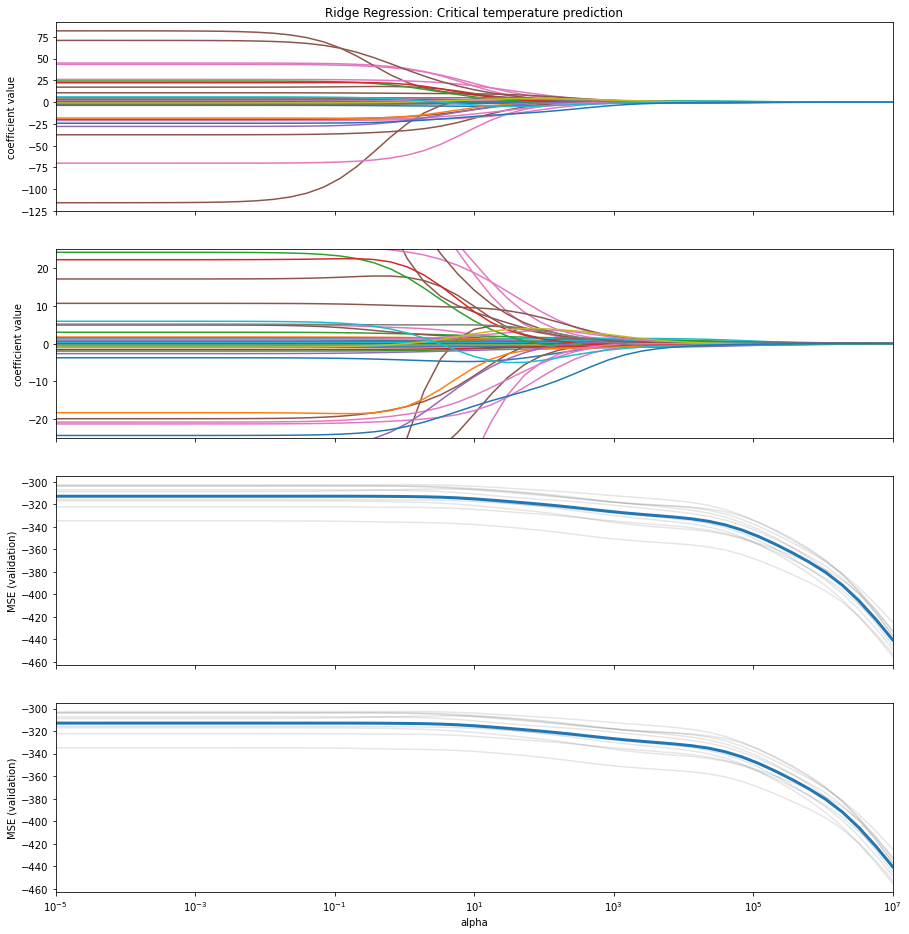

In [129]:
fig, ax = plt.subplots(4,1,figsize=(15,16), sharex=True)
ax[0].plot(alphas, coeffs)
ax[0].set_xticks(alphas)
ax[0].set_ylabel('coefficient value')
ax[0].set_title('Ridge Regression: Critical temperature prediction')
ax[1].plot(alphas, coeffs)
ax[1].set_ylabel('coefficient value')
ax[1].set_ylim([-25, 25])
ax[1].set_xlim([alphas[0], alphas[-1]])
ax[2].plot(alphas, cv_scores, color='k', alpha=0.1)
ax[2].plot(alphas, np.mean(cv_scores, axis=1), linewidth=3)
ax[2].set_ylabel('MSE (validation)')
#ax[2].set_ylim([0.0,1.0])
ax[3].plot(alphas, cv_scores, color='k', alpha=0.1)
ax[3].plot(alphas, np.mean(cv_scores, axis=1), linewidth=3)
ax[3].set_xscale('log')
ax[3].set_ylabel('MSE (validation)')
ax[3].set_xlabel('alpha')
#ax[3].set_ylim([0.7,0.76])
plt.show()

In [143]:
ridge = Ridge(alpha=9)
ridge.fit(X_train, y_train)

print('training R2-score:', np.round(r2_score(y_train, ridge.predict(X_train)),4))

scores_ridge = cross_val_score(ridge, X_train, y_train, cv=10, scoring='neg_mean_squared_error')
print("validation R2-scores:",np.round(scores_ridge,4))
print("average:", np.round(np.mean(scores_ridge),4))

print('-----')
print('Ridge coefficients (wind):')
for i, coeff in enumerate(ridge.coef_):
  print('{0:5s}  {1:>-10.2f}'.format(df_feature.columns[i], np.round(coeff,2)))

training R2-score: 0.7349
validation R2-scores: [-343.0048 -326.8513 -290.3349 -330.4545 -297.7828 -325.0516 -322.1678
 -310.1471 -300.8967 -304.1161]
average: -315.0808
-----
Ridge coefficients (wind):
number_of_elements       -4.38
mean_atomic_mass        0.82
wtd_mean_atomic_mass       -0.77
gmean_atomic_mass       -0.51
wtd_gmean_atomic_mass        0.54
entropy_atomic_mass      -18.40
wtd_entropy_atomic_mass        2.39
range_atomic_mass        0.23
wtd_range_atomic_mass        0.02
std_atomic_mass       -0.49
wtd_std_atomic_mass       -0.00
mean_fie        0.10
wtd_mean_fie        0.04
gmean_fie       -0.09
wtd_gmean_fie       -0.01
entropy_fie        4.16
wtd_entropy_fie       17.97
range_fie        0.07
wtd_range_fie        0.01
std_fie       -0.17
wtd_std_fie       -0.05
mean_atomic_radius       -0.00
wtd_mean_atomic_radius        2.06
gmean_atomic_radius       -0.28
wtd_gmean_atomic_radius       -1.70
entropy_atomic_radius        7.29
wtd_entropy_atomic_radius       21.67
rang

Ridge didn't provide any help in terms of r2 score, but the superficially large coefficients are not present anymore

## Lasso regression

In [133]:
from sklearn.linear_model import Lasso

n_fold = 10
alphas = np.logspace(-1, 2, 41)
coeffs = np.zeros((len(alphas), n_feats))
cv_scores = np.zeros((len(alphas), n_fold))

for i, alpha in enumerate(alphas):
    print(i, alpha)
    lasso = Lasso(alpha, random_state=2022, max_iter=50000).fit(X_train, y_train)
    coeffs[i,:] = lasso.coef_
    cv_scores[i,:] = cross_val_score(lasso, X_train, y_train, cv=n_fold, scoring='neg_mean_squared_error', n_jobs = -1)   

0 0.1
1 0.11885022274370183
2 0.14125375446227545
3 0.16788040181225602
4 0.19952623149688797
5 0.23713737056616552
6 0.28183829312644537
7 0.33496543915782767
8 0.3981071705534972
9 0.4731512589614804
10 0.5623413251903491
11 0.6683439175686146
12 0.7943282347242814
13 0.9440608762859233
14 1.1220184543019636
15 1.333521432163324
16 1.5848931924611134
17 1.8836490894898001
18 2.238721138568339
19 2.6607250597988097
20 3.1622776601683795
21 3.758374042884441
22 4.46683592150963
23 5.308844442309882
24 6.30957344480193
25 7.498942093324558
26 8.912509381337454
27 10.592537251772887
28 12.589254117941675
29 14.962356560944327
30 17.78279410038923
31 21.134890398366455
32 25.118864315095795
33 29.853826189179603
34 35.481338923357534
35 42.169650342858226
36 50.118723362727195
37 59.566214352901035
38 70.79457843841381
39 84.13951416451947
40 100.0


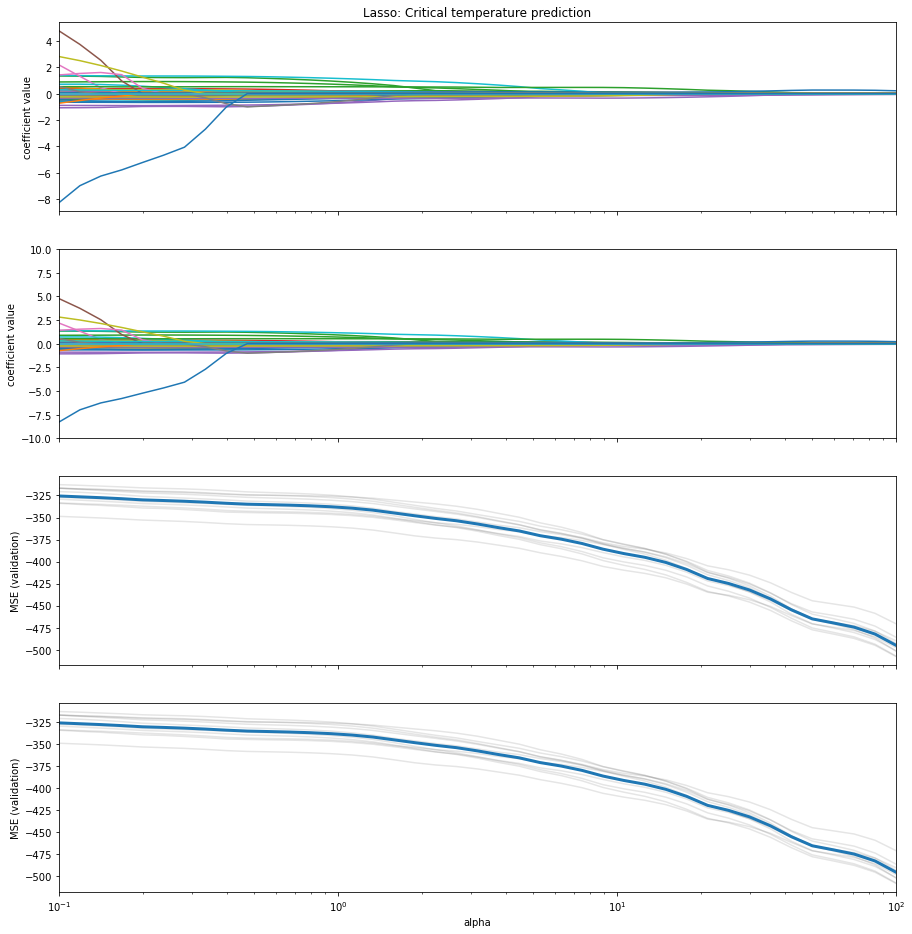

In [134]:
fig, ax = plt.subplots(4,1,figsize=(15,16), sharex=True)
ax[0].plot(alphas, coeffs)
ax[0].set_xticks(alphas)
ax[0].set_ylabel('coefficient value')
ax[0].set_title('Lasso: Critical temperature prediction')
ax[1].plot(alphas, coeffs)
ax[1].set_ylabel('coefficient value')
ax[1].set_ylim([-10, 10])
ax[1].set_xlim([alphas[0], alphas[-1]])
ax[2].plot(alphas, cv_scores, color='k', alpha=0.1)
ax[2].plot(alphas, np.mean(cv_scores, axis=1), linewidth=3)
ax[2].set_ylabel('MSE (validation)')
#ax[2].set_ylim([0.0,1.0])
ax[3].plot(alphas, cv_scores, color='k', alpha=0.1)
ax[3].plot(alphas, np.mean(cv_scores, axis=1), linewidth=3)
ax[3].set_xscale('log')
ax[3].set_ylabel('MSE (validation)')
ax[3].set_xlabel('alpha')
#ax[3].set_ylim([0.6,0.75])
plt.show()

In [144]:
lasso = Lasso(alpha=0.1, random_state=2022, max_iter=25000)
lasso.fit(X_train, y_train)

print('training MSE:', np.round(mean_squared_error(y_train, lasso.predict(X_train)),4))

scores_lasso = cross_val_score(lasso, X_train, y_train, cv=10, scoring='neg_mean_squared_error', n_jobs = -1)
print("validation MSE:",np.round(scores_lasso,4))
print("average:", np.round(np.mean(scores_lasso),6))

print('-----')
print('Lasso coefficients (wind):')
for i, coeff in enumerate(lasso.coef_):
  print('{0:5s}  {1:>-10.2f}'.format(df_feature.columns[i], np.round(coeff,2)))

training MSE: 323.4388
validation MSE: [-357.1284 -337.4429 -299.5741 -341.5652 -305.9407 -338.6794 -332.4966
 -318.2049 -310.4581 -313.1489]
average: -325.463916
-----
Lasso coefficients (wind):
number_of_elements       -0.00
mean_atomic_mass        0.43
wtd_mean_atomic_mass       -0.17
gmean_atomic_mass       -0.23
wtd_gmean_atomic_mass        0.05
entropy_atomic_mass       -0.00
wtd_entropy_atomic_mass        0.00
range_atomic_mass        0.24
wtd_range_atomic_mass       -0.02
std_atomic_mass       -0.25
wtd_std_atomic_mass       -0.28
mean_fie        0.03
wtd_mean_fie        0.13
gmean_fie       -0.01
wtd_gmean_fie       -0.12
entropy_fie        0.00
wtd_entropy_fie        0.00
range_fie        0.08
wtd_range_fie        0.02
std_fie       -0.18
wtd_std_fie       -0.05
mean_atomic_radius        0.28
wtd_mean_atomic_radius        1.29
gmean_atomic_radius       -0.47
wtd_gmean_atomic_radius       -1.02
entropy_atomic_radius        0.00
wtd_entropy_atomic_radius        0.00
range_atomi

Lasso doesn't seem helpful at all either.

## Evaluating results on test set

In [145]:
y_pred = lr.predict(X_test)
print('MSE (lr):', np.round(mean_squared_error(y_pred, y_test),1))
print('R-squared (lr):', np.round(r2_score(y_pred, y_test), 5))

print('---')

y_pred = ridge.predict(X_test)
print('MSE (ridge):', np.round(mean_squared_error(y_pred, y_test),1))
print('R-squared (ridge):', np.round(r2_score(y_pred, y_test),5))

print('---')

y_pred = lasso.predict(X_test)
print('MSE (lasso):', np.round(mean_squared_error(y_pred, y_test),1))
print('R-squared (lasso):', np.round(r2_score(y_pred, y_test),5))

MSE (lr): 302.0
R-squared (lr): 0.65111
---
MSE (ridge): 304.8
R-squared (ridge): 0.64467
---
MSE (lasso): 314.3
R-squared (lasso): 0.62606


Linear regression perform the best. What's puzzling is that regularizations didn't help with colinearity. Some featuers are clearly highly correlated, maybe manual or random forest feature selection is useful. 

In [149]:
df_y= y_test.to_frame()
df_y['lr'] = lr.predict(X_test)
df_y['ridge'] = ridge.predict(X_test)
df_y['lasso'] = lasso.predict(X_test)

df_y_g = df_y.loc[df_y['critical_temp'] > 77] # use liquid nitrogen as benchmark
df_y_s = df_y.loc[df_y['critical_temp'] <= 77]
#val_y_pred_0 = val_y_pred.loc[val_y_pred['critical_temp'] <= 4]
print(len(df_y_g))
print(len(df_y_s))

761
3492


In [150]:
print("LR MSE in critical temp", mean_squared_error(df_y['lr'], df_y['critical_temp']))
print("LR MSE in higher than 77 critical temp", mean_squared_error(df_y_g['lr'], df_y_g['critical_temp']))
print("LR MSE in lower than 77 critical temp", mean_squared_error(df_y_s['lr'], df_y_s['critical_temp']))
print("LR R2 in critical temp", r2_score(df_y['lr'], df_y['critical_temp']))
print("LR R2 in higher than 77 critical temp", r2_score(df_y_g['lr'], df_y_g['critical_temp']))
print("LR R2 in lower than 77 critical temp", r2_score(df_y_s['lr'], df_y_s['critical_temp']))

LR MSE in critical temp 302.00751255014757
LR MSE in higher than 77 critical temp 528.2639424933056
LR MSE in lower than 77 critical temp 252.70019777731153
LR R2 in critical temp 0.6511074199683282
LR R2 in higher than 77 critical temp -1.7597133685461888
LR R2 in lower than 77 critical temp 0.5996249100372508


In [189]:
sns.color_palette("Set2")

[(0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235),
 (1.0, 0.8509803921568627, 0.1843137254901961),
 (0.8980392156862745, 0.7686274509803922, 0.5803921568627451),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254)]

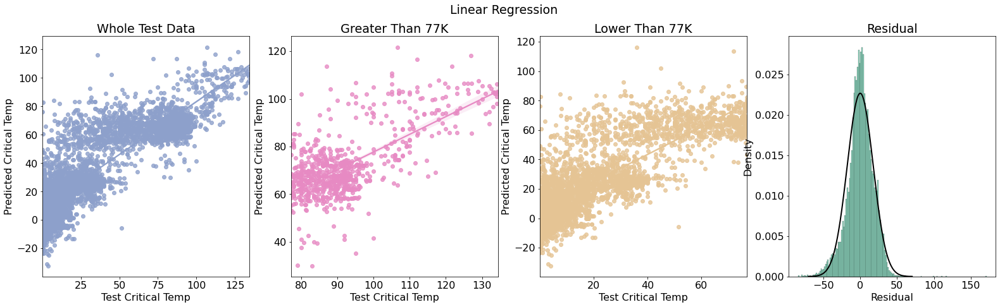

In [193]:
residual = y_test - df_y['lr']
fig, axes = plt.subplots(1,4, figsize = (27,7))
ax1 = axes[0]
sns.regplot(ax = ax1, x = y_test, y = df_y['lr'], color = sns.color_palette("Set2")[2])
ax1.set_xlabel('Test Critical Temp')
ax1.set_ylabel('Predicted Critical Temp')
ax1.set_title('Whole Test Data')
ax2 = axes[1]
sns.regplot(ax = ax2, x = df_y_g['critical_temp'], y = df_y_g['lr'], color = sns.color_palette("Set2")[3])
ax2.set_xlabel('Test Critical Temp')
ax2.set_ylabel('Predicted Critical Temp')
ax2.set_title('Greater Than 77K')
ax3 = axes[2]
sns.regplot(ax = ax3, x = df_y_s['critical_temp'], y = df_y_s['lr'], color = sns.color_palette("Set2")[6])
ax3.set_xlabel('Test Critical Temp')
ax3.set_ylabel('Predicted Critical Temp')
ax3.set_title('Lower Than 77K')
ax4 = axes[3]
sns.histplot(ax = ax4, x=data, stat="density", color = sns.color_palette("Set2")[0])
normal(data.mean(), data.std()) 
ax4.set_title('Residual')
ax4.set_xlabel('Residual')
ax4.set_ylabel('Density')
fig.suptitle('XGB Regression')
fig.suptitle('Linear Regression')
plt.savefig('lr_tp.pdf', bbox_inches = 'tight')

In [151]:
print("Ridge MSE in critical temp", mean_squared_error(df_y['ridge'], df_y['critical_temp']))
print("Ridge MSE in higher than 77 critical temp", mean_squared_error(df_y_g['ridge'], df_y_g['critical_temp']))
print("Ridge MSE in lower than 77 critical temp", mean_squared_error(df_y_s['ridge'], df_y_s['critical_temp']))
print("Ridge R2 in critical temp", r2_score(df_y['ridge'], df_y['critical_temp']))
print("Ridge R2 in higher than 77 critical temp", r2_score(df_y_g['ridge'], df_y_g['critical_temp']))
print("Ridge R2 in lower than 77 critical temp", r2_score(df_y_s['ridge'], df_y_s['critical_temp']))

Ridge MSE in critical temp 304.7516848168278
Ridge MSE in higher than 77 critical temp 537.7302809614151
Ridge MSE in lower than 77 critical temp 253.97943061693343
Ridge R2 in critical temp 0.644665096354343
Ridge R2 in higher than 77 critical temp -1.9163197273921053
Ridge R2 in lower than 77 critical temp 0.5962707096364853


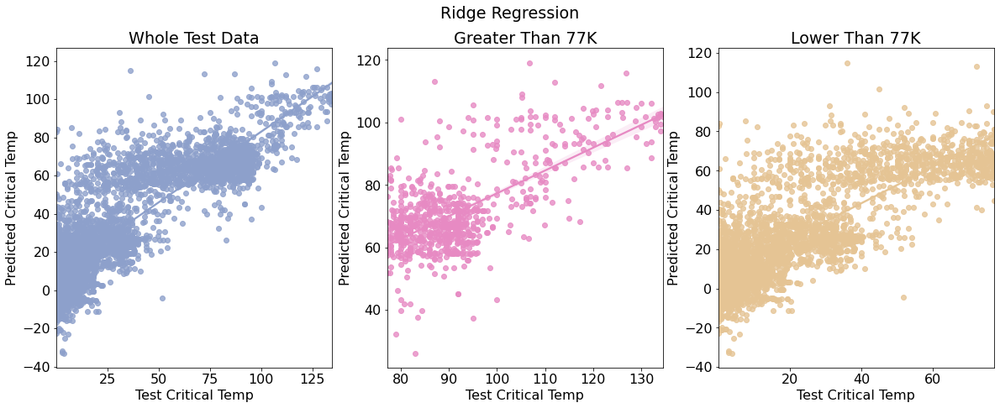

In [191]:
fig, axes = plt.subplots(1,3, figsize = (20,7))
ax1 = axes[0]
sns.regplot(ax = ax1, x = y_test, y = df_y['ridge'], color = sns.color_palette("Set2")[2])
ax1.set_xlabel('Test Critical Temp')
ax1.set_ylabel('Predicted Critical Temp')
ax1.set_title('Whole Test Data')
ax2 = axes[1]
sns.regplot(ax = ax2, x = df_y_g['critical_temp'], y = df_y_g['ridge'], color = sns.color_palette("Set2")[3])
ax2.set_xlabel('Test Critical Temp')
ax2.set_ylabel('Predicted Critical Temp')
ax2.set_title('Greater Than 77K')
ax3 = axes[2]
sns.regplot(ax = ax3, x = df_y_s['critical_temp'], y = df_y_s['ridge'], color = sns.color_palette("Set2")[6])
ax3.set_xlabel('Test Critical Temp')
ax3.set_ylabel('Predicted Critical Temp')
ax3.set_title('Lower Than 77K')
fig.suptitle('Ridge Regression')
plt.savefig('ridge_tp.pdf', bbox_inches = 'tight')

In [152]:
print("Lasso MSE in critical temp", mean_squared_error(df_y['lasso'], df_y['critical_temp']))
print("Lasso MSE in higher than 77 critical temp", mean_squared_error(df_y_g['lasso'], df_y_g['critical_temp']))
print("Lasso MSE in lower than 77 critical temp", mean_squared_error(df_y_s['lasso'], df_y_s['critical_temp']))
print("Lasso R2 in critical temp", r2_score(df_y['lasso'], df_y['critical_temp']))
print("Lasso R2 in higher than 77 critical temp", r2_score(df_y_g['lasso'], df_y_g['critical_temp']))
print("Lasso R2 in lower than 77 critical temp", r2_score(df_y_s['lasso'], df_y_s['critical_temp']))

Lasso MSE in critical temp 314.32817189215245
Lasso MSE in higher than 77 critical temp 562.6018158160974
Lasso MSE in lower than 77 critical temp 260.2227185627933
Lasso R2 in critical temp 0.626060313596821
Lasso R2 in higher than 77 critical temp -2.209733615256664
Lasso R2 in lower than 77 critical temp 0.5824862255026041


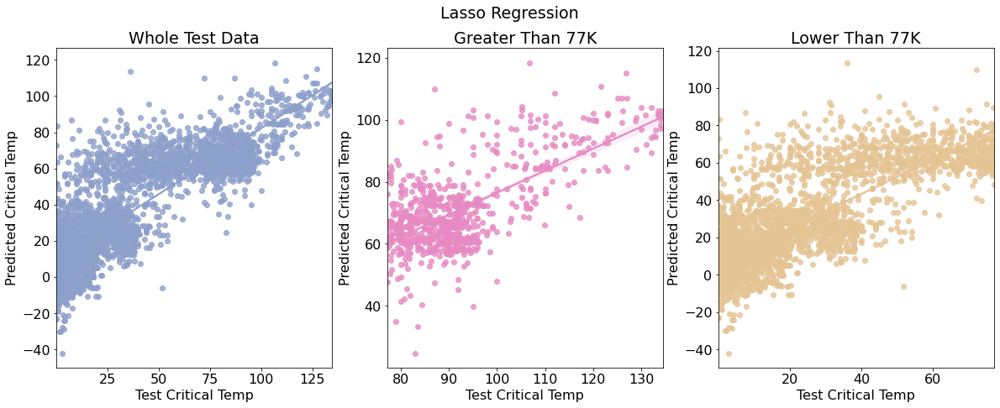

In [192]:
fig, axes = plt.subplots(1,3, figsize = (20,7))
ax1 = axes[0]
sns.regplot(ax = ax1, x = y_test, y = df_y['lasso'], color = sns.color_palette("Set2")[2])
ax1.set_xlabel('Test Critical Temp')
ax1.set_ylabel('Predicted Critical Temp')
ax1.set_title('Whole Test Data')
ax2 = axes[1]
sns.regplot(ax = ax2, x = df_y_g['critical_temp'], y = df_y_g['lasso'], color = sns.color_palette("Set2")[3])
ax2.set_xlabel('Test Critical Temp')
ax2.set_ylabel('Predicted Critical Temp')
ax2.set_title('Greater Than 77K')
ax3 = axes[2]
sns.regplot(ax = ax3, x = df_y_s['critical_temp'], y = df_y_s['lasso'], color = sns.color_palette("Set2")[6])
ax3.set_xlabel('Test Critical Temp')
ax3.set_ylabel('Predicted Critical Temp')
ax3.set_title('Lower Than 77K')
fig.suptitle('Lasso Regression')
plt.savefig('lasso_tp.pdf', bbox_inches = 'tight')

# Improved Method: Random Forest
From the data visualization, we can see that a lot of features are correlated, and some of the features don't have necessary correlation with the target. Therefore, we choose to use random forest which has an embedded feature selection process.

In [40]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error

forest_model = RandomForestRegressor(random_state=1, oob_score= True)
forest_model.fit(X_train, y_train)
print(forest_model.oob_score_)

0.9240353083178428


In [41]:
forest_model.score(X_train, y_train) # I think this is the R2 score.

0.9777940938812709

In [46]:
for i, var in enumerate(atomic_mass_cols):
  print('{0:5s}  {1:>-10.4f}'.format(var, np.round(forest_model.feature_importances_[i],4))) 

mean_atomic_mass      0.0001
wtd_mean_atomic_mass      0.0009
gmean_atomic_mass      0.0069
wtd_gmean_atomic_mass      0.0015
entropy_atomic_mass      0.0026
wtd_entropy_atomic_mass      0.0014
range_atomic_mass      0.0036
wtd_range_atomic_mass      0.0011
std_atomic_mass      0.0079
wtd_std_atomic_mass      0.0235


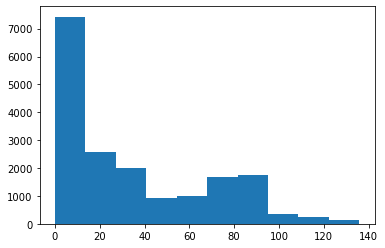

In [47]:
train_pred = forest_model.predict(X_train)
plt.hist(train_pred)
plt.show()

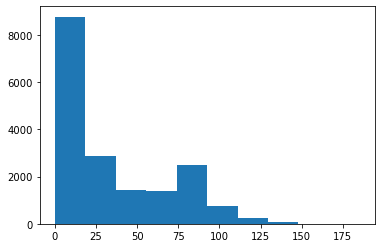

In [48]:
plt.hist(y_train)
plt.show()

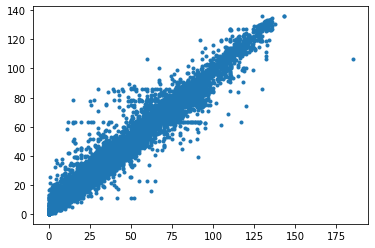

In [52]:
plt.plot(y_train, train_pred, '.')
plt.show()

# Use elements data for Linear Regression

In [113]:
lr_e = LinearRegression()
lr_e.fit(Xe_train, ye_train)
print('training R2-score:', np.round(r2_score(ye_train, lr_e.predict(Xe_train)),4))

scores_lr = cross_val_score(lr, Xe_train, ye_train, cv=10, scoring='r2')

print("validation R2-scores:",np.round(scores_lr,4))
print("average:", np.round(np.mean(scores_lr),4))

training R2-score: 0.6098
validation R2-scores: [ 0.6312  0.6534  0.6276  0.4744  0.6379 -0.2404  0.5371  0.3512  0.5827
  0.6388]
average: 0.4894


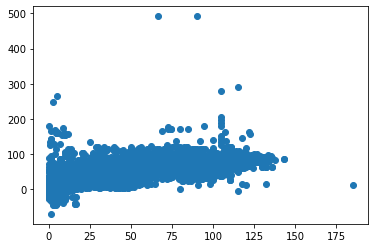

In [114]:
plt.scatter(ye_train, lr_e.predict(Xe_train))
plt.show()